In [ ]:
##Downloading and extracting dataset
!pip install gdown
import gdown
file_id = ""  # Replace this with your file's ID
output_file = "data_file.zip"  # Replace "data_file.ext" with the desired output filename and extension
gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file)

In [2]:
%%capture
!unzip data_file.zip

In [3]:
#General Imports
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd
import os
import tensorflow as tf
import keras

2024-03-21 13:33:49.905664: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-21 13:33:49.905769: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-21 13:33:50.045870: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
#Numpy Random Seed for reproducibility
np.random.seed(32)

In [5]:
#Helper function(s)
def random_split_array(data, ratios=(0.8, 0.1, 0.1)):
    np.random.shuffle(data)  # Shuffle for randomness
    split_indices = np.cumsum(ratios[:-1]) * len(data)
    return np.split(data, split_indices.astype(int))


In [6]:
#Train-test-val split
original = []
for i in range(131) :
    original.append(i)

train, test, val = random_split_array(original,(0.8,0.1,0.1))

#These arrays will contain paths of images, and tumor mask
X_train = []
Y_train = []
X_test = []
Y_test = []
X_val = []
Y_val = []

scan_list = os.listdir("/kaggle/working/Task03_Liver")
scan_list.sort()
for i in scan_list:
    num = int(i.split("_")[-1])
    path = "/kaggle/working/Task03_Liver/" + i
    imgpath = path + "/images"
    maskpath = path + "/masks"
    piclist = os.listdir(imgpath)
    if num in train:
        for j in piclist:
            X_train.append(imgpath + "/" + j)
            Y_train.append(maskpath + "/cancer/" +j)
    elif num in test:
        for j in piclist:
            X_test.append(imgpath + "/" + j)
            Y_test.append(maskpath + "/cancer/" +j)
    else:
        for j in piclist:
            X_val.append(imgpath + "/" + j)
            Y_val.append(maskpath + "/cancer/" +j)



In [7]:
def load_and_preprocess(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=1)  # Or the format of your images
    image = tf.image.resize(image, [256, 256])
    image = tf.cast(image, tf.float32) / 255.0
    return image

#These arrays will contain only those image,mask path pairs that have non-zero tumor value
Xm_train = []
Ym_train = []
Xm_test = []
Ym_test = []
Xm_val = []
Ym_val = []
for i in range(len(Y_train)):
  if np.max((load_and_preprocess(Y_train[i]))) > 0:
    Xm_train.append(X_train[i])
    Ym_train.append(Y_train[i])

for i in range(len(Y_test)):
  if np.max((load_and_preprocess(Y_test[i]))) > 0:
    Xm_test.append(X_test[i])
    Ym_test.append(Y_test[i])

for i in range(len(Y_val)):
  if np.max((load_and_preprocess(Y_val[i]))) > 0:
    Xm_val.append(X_val[i])
    Ym_val.append(Y_val[i])



In [8]:
#This is the number of images in training, testing and validation having non-zero tumor value
print(len(Xm_train),len(Xm_test),len(Xm_val))

5518 739 933


In [9]:
#Preparing tf Datasets from the paths
image_ds = tf.data.Dataset.from_tensor_slices(Xm_train)
image_ds = image_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
mask_ds = tf.data.Dataset.from_tensor_slices(Ym_train)
mask_ds = mask_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = tf.data.Dataset.zip((image_ds,mask_ds))

image1_ds = tf.data.Dataset.from_tensor_slices(Xm_val)
image1_ds = image1_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
mask1_ds = tf.data.Dataset.from_tensor_slices(Ym_val)
mask1_ds = mask1_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = tf.data.Dataset.zip((image1_ds,mask1_ds))

image2_ds = tf.data.Dataset.from_tensor_slices(Xm_test)
image2_ds = image2_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
mask2_ds = tf.data.Dataset.from_tensor_slices(Ym_test)
mask2_ds = mask2_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = tf.data.Dataset.zip((image2_ds,mask2_ds))

In [10]:
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model

def conv_block(x, num_filters):
    x = L.Conv2D(num_filters, 3, padding="same")(x)
    x = L.BatchNormalization()(x)
    x = L.Activation("relu")(x)

    x = L.Conv2D(num_filters, 3, padding="same")(x)
    x = L.BatchNormalization()(x)
    x = L.Activation("relu")(x)

    return x

def encoder_block(x, num_filters):
    x = conv_block(x, num_filters)
    p = L.MaxPool2D((2, 2))(x)
    return x, p

def attention_gate(g, s, num_filters):
    Wg = L.Conv2D(num_filters, 1, padding="same")(g)
    Wg = L.BatchNormalization()(Wg)

    Ws = L.Conv2D(num_filters, 1, padding="same")(s)
    Ws = L.BatchNormalization()(Ws)

    out = L.Activation("relu")(Wg + Ws)
    out = L.Conv2D(num_filters, 1, padding="same")(out)
    out = L.Activation("sigmoid")(out)

    return out * s

def decoder_block(x, s, num_filters):
    x = L.UpSampling2D(interpolation="bilinear")(x)
    s = attention_gate(x, s, num_filters)
    x = L.Concatenate()([x, s])
    x = conv_block(x, num_filters)
    return x

def attention_unet(input_shape):
    """ Inputs """
    inputs = L.Input(input_shape)

    """ Encoder """
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)

    b1 = conv_block(p3, 512)

    """ Decoder """
    d1 = decoder_block(b1, s3, 256)
    d2 = decoder_block(d1, s2, 128)
    d3 = decoder_block(d2, s1, 64)

    """ Outputs """
    outputs = L.Conv2D(1, 1, padding="same", activation="sigmoid")(d3)

    """ Model """
    model = Model(inputs, outputs, name="Attention-UNET")
    return model

input_shape = (256, 256, 1)
model = attention_unet(input_shape)
model.summary()

Model: "Attention-UNET"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        640 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │      1,024 │ conv2d_4[0][0]  

 Total params: 8,142,017 (31.06 MB)

 Trainable params: 8,134,593 (31.03 MB)

 Non-trainable params: 7,424 (29.00 KB)

In [11]:
#Defining dice loss functions. dice is actual dice-function value, while dice_loss is 1-dice. if dice_loss is minimized, dice is maximized.

def dice_loss(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    dice = numerator / (denominator + 1e-1)
    return 1 - dice

def dice(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    dice = numerator / (denominator + 1e-20)
    return dice

In [12]:

from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}.weights.h5.keras".format('cxr_reg')

checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min', save_weights_only = False)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                                   patience=10,
                                   verbose=1, mode='min', epsilon=0.0001, cooldown=2, min_lr=1e-8)
early = EarlyStopping(monitor="val_loss",
                      mode="min",
                      patience=20) # probably needs to be more patient, but kaggle time is limited
callbacks_list = [checkpoint, early, reduceLROnPlat]

In [13]:
BATCH_SIZE = 20
train_ds = train_ds.shuffle(buffer_size=100)  # Shuffle dataset for better training
train_ds = train_ds.batch(BATCH_SIZE)
train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE)

In [14]:
model.compile(optimizer=tf.keras.optimizers.AdamW(), loss=dice_loss, metrics = [dice])

In [15]:
#Training the Model
history = model.fit(train_ds,
    epochs=40,
    validation_data=val_ds,
    callbacks = callbacks_list,
)

Epoch 1/40


2024-03-21 13:35:05.373774: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 1.67237, expected 0.693245
2024-03-21 13:35:05.373836: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 1.84259, expected 0.863458
2024-03-21 13:35:05.373846: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 2.35421, expected 1.37508
2024-03-21 13:35:05.373854: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 2.44188, expected 1.46276
2024-03-21 13:35:05.373862: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 2.10751, expected 1.12838
2024-03-21 13:35:05.373870: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 2.46902, expected 1.48989
2024-03-21 13:35:05.373878: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 2.62875, expected 1.64962
2024-03-21 13:35:05.373885: E external/local_xla/xla/

275/276 ━━━━━━━━━━━━━━━━━━━━ 0s 623ms/step - dice: 0.2758 - loss: 0.7242

2024-03-21 13:39:20.018919: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 1.23591, expected 0.864678
2024-03-21 13:39:20.018976: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 1.88108, expected 1.50984
2024-03-21 13:39:20.018985: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 2.47667, expected 2.10544
2024-03-21 13:39:20.018993: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 2.34476, expected 1.97353
2024-03-21 13:39:20.019001: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 2.30373, expected 1.9325
2024-03-21 13:39:20.019009: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 2.32359, expected 1.95236
2024-03-21 13:39:20.019017: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 1.7665, expected 1.39526
2024-03-21 13:39:20.019025: E external/local_xla/xla/ser

276/276 ━━━━━━━━━━━━━━━━━━━━ 0s 892ms/step - dice: 0.2763 - loss: 0.7237

2024-03-21 13:40:47.025142: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 1.49216, expected 0.786262
2024-03-21 13:40:47.025200: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 2.70927, expected 2.00337
2024-03-21 13:40:47.025210: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 3.11783, expected 2.41193
2024-03-21 13:40:47.025219: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 3.06849, expected 2.36259
2024-03-21 13:40:47.025227: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 3.34371, expected 2.63781
2024-03-21 13:40:47.025236: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 3.51069, expected 2.80479
2024-03-21 13:40:47.025244: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 3.29587, expected 2.58997
2024-03-21 13:40:47.025252: E external/local_xla/xla/s


Epoch 1: val_loss improved from inf to 0.98046, saving model to cxr_reg.weights.h5.keras
276/276 ━━━━━━━━━━━━━━━━━━━━ 376s 1s/step - dice: 0.2768 - loss: 0.7232 - val_dice: 0.0195 - val_loss: 0.9805 - learning_rate: 0.0010
Epoch 2/40
276/276 ━━━━━━━━━━━━━━━━━━━━ 0s 623ms/step - dice: 0.4760 - loss: 0.5240
Epoch 2: val_loss improved from 0.98046 to 0.81654, saving model to cxr_reg.weights.h5.keras
276/276 ━━━━━━━━━━━━━━━━━━━━ 185s 671ms/step - dice: 0.4761 - loss: 0.5239 - val_dice: 0.1835 - val_loss: 0.8165 - learning_rate: 0.0010
Epoch 3/40
276/276 ━━━━━━━━━━━━━━━━━━━━ 0s 623ms/step - dice: 0.4759 - loss: 0.5241
Epoch 3: val_loss improved from 0.81654 to 0.58066, saving model to cxr_reg.weights.h5.keras
276/276 ━━━━━━━━━━━━━━━━━━━━ 185s 671ms/step - dice: 0.4761 - loss: 0.5239 - val_dice: 0.4193 - val_loss: 0.5807 - learning_rate: 0.0010
Epoch 4/40
276/276 ━━━━━━━━━━━━━━━━━━━━ 0s 623ms/step - dice: 0.4887 - loss: 0.5114
Epoch 4: val_loss improved from 0.58066 to 0.50927, saving model

In [16]:
#Loading best validation weights for testing further
model.load_weights("/kaggle/working/cxr_reg.weights.h5.keras")

In [17]:
#Generating X_test and Y_test arrays and displaying a image,mask pair to check correspondance
Xts =[]
Yts =[]
for i in test_ds:
    x,y=i
    Xts.append(x)
    Yts.append(y)

In [18]:
#Evaluating model on test data
model.evaluate(np.array(Xts),np.array(Yts))

2024-03-21 15:41:32.040174: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65536: 1.05936, expected 0.681349
2024-03-21 15:41:32.040237: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65537: 2.21753, expected 1.83952
2024-03-21 15:41:32.040248: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65538: 2.5462, expected 2.16819
2024-03-21 15:41:32.040256: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65539: 2.07291, expected 1.6949
2024-03-21 15:41:32.040264: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65540: 2.56529, expected 2.18728
2024-03-21 15:41:32.040272: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65542: 2.19261, expected 1.8146
2024-03-21 15:41:32.040280: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65543: 1.83463, expected 1.45662
2024-03-21 15:41:32.040288: E

23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step - dice: 0.6761 - loss: 0.3239

2024-03-21 15:42:26.899919: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 0.727908, expected 0.233536
2024-03-21 15:42:26.899979: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 1.7588, expected 1.26443
2024-03-21 15:42:26.899989: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 1.59598, expected 1.10161
2024-03-21 15:42:26.899998: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 2.28727, expected 1.7929
2024-03-21 15:42:26.900008: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 2.27906, expected 1.78469
2024-03-21 15:42:26.900017: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 1.91854, expected 1.42417
2024-03-21 15:42:26.900025: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 2.37004, expected 1.87567
2024-03-21 15:42:26.900034: E external/local_xla/xla/se

24/24 ━━━━━━━━━━━━━━━━━━━━ 62s 711ms/step - dice: 0.6663 - loss: 0.3337


[0.4472033977508545, 0.5528025031089783]

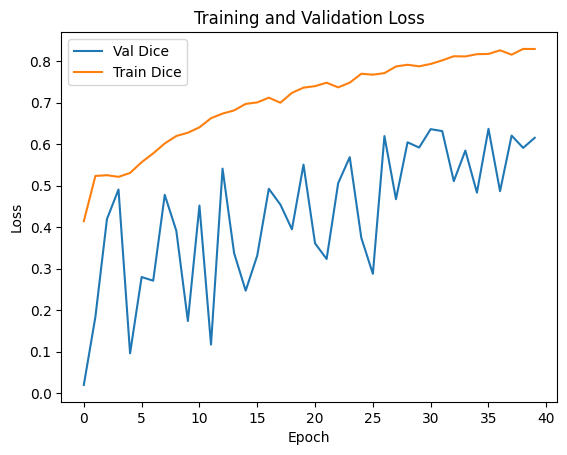

In [19]:
#Training and validation loss curves
plt.plot(history.history['val_dice'], label='Val Dice')
plt.plot(history.history['dice'], label='Train Dice')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [20]:
len(Xm_test)

739

['/kaggle/working/Task03_Liver/liver_10/images/433.jpg', '/kaggle/working/Task03_Liver/liver_100/images/477.jpg', '/kaggle/working/Task03_Liver/liver_100/images/592.jpg', '/kaggle/working/Task03_Liver/liver_100/images/449.jpg', '/kaggle/working/Task03_Liver/liver_100/images/445.jpg', '/kaggle/working/Task03_Liver/liver_100/images/447.jpg', '/kaggle/working/Task03_Liver/liver_100/images/465.jpg', '/kaggle/working/Task03_Liver/liver_100/images/498.jpg', '/kaggle/working/Task03_Liver/liver_81/images/240.jpg', '/kaggle/working/Task03_Liver/liver_84/images/616.jpg', '/kaggle/working/Task03_Liver/liver_11/images/299.jpg', '/kaggle/working/Task03_Liver/liver_84/images/502.jpg', '/kaggle/working/Task03_Liver/liver_100/images/432.jpg', '/kaggle/working/Task03_Liver/liver_100/images/567.jpg', '/kaggle/working/Task03_Liver/liver_65/images/427.jpg', '/kaggle/working/Task03_Liver/liver_82/images/420.jpg', '/kaggle/working/Task03_Liver/liver_84/images/489.jpg', '/kaggle/working/Task03_Liver/liver_82

2024-03-21 15:42:42.666342: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65536: 0.961309, expected 0.421057
2024-03-21 15:42:42.666425: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65537: 2.31528, expected 1.77503
2024-03-21 15:42:42.666436: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65538: 2.17812, expected 1.63786
2024-03-21 15:42:42.666445: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65539: 2.11732, expected 1.57707
2024-03-21 15:42:42.666454: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65540: 2.64766, expected 2.1074
2024-03-21 15:42:42.666463: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65541: 2.68691, expected 2.14665
2024-03-21 15:42:42.666472: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65542: 2.00241, expected 1.46216
2024-03-21 15:42:42.666483

4/4 ━━━━━━━━━━━━━━━━━━━━ 11s 3s/step


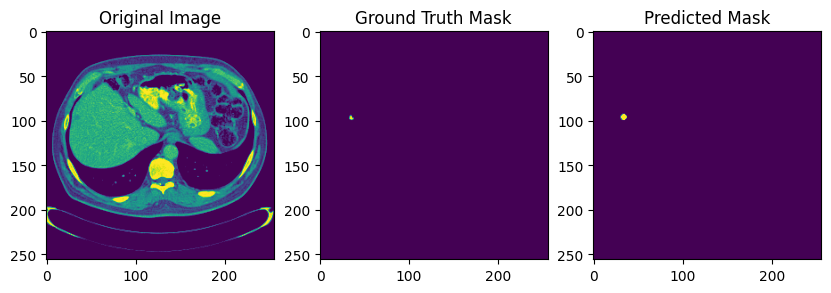

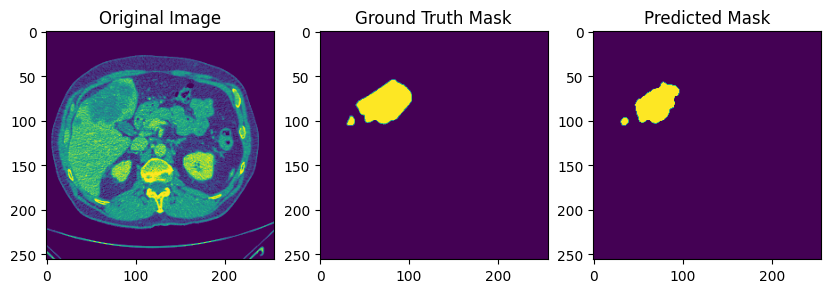

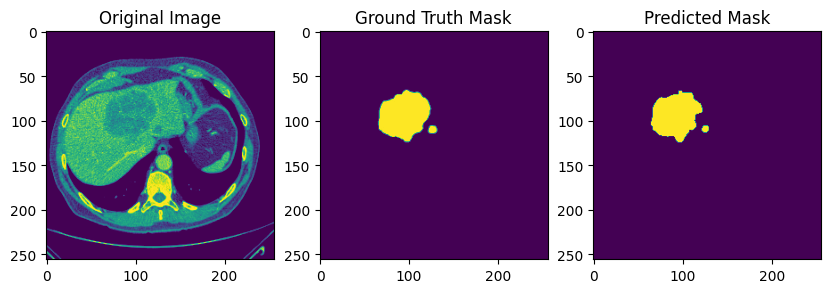

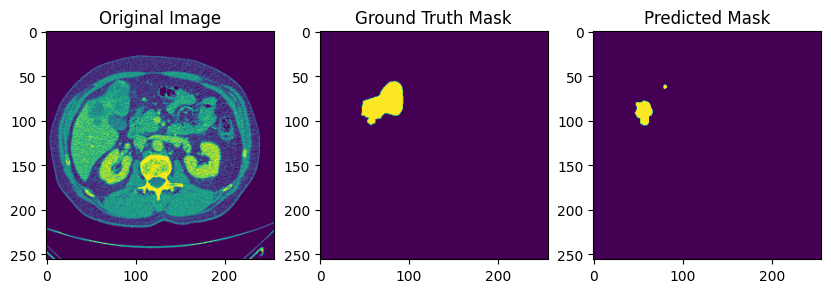

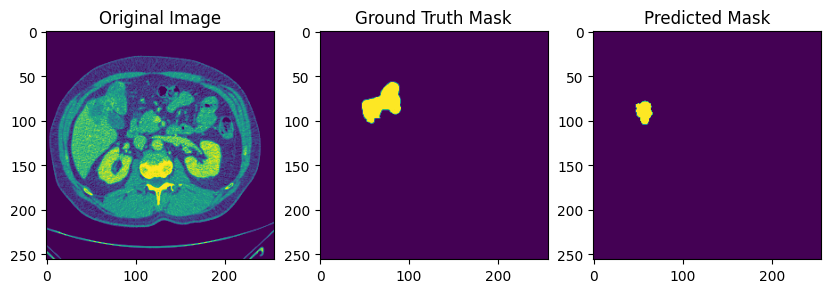

...

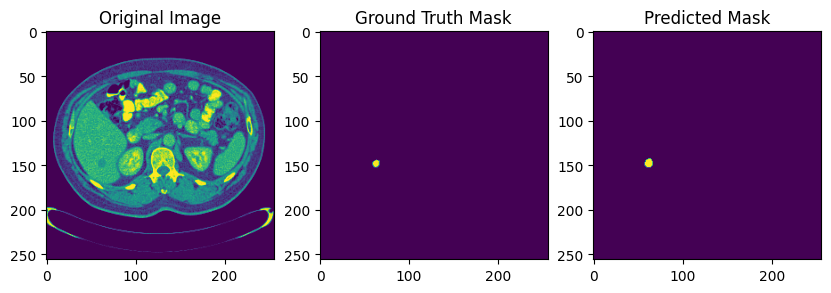

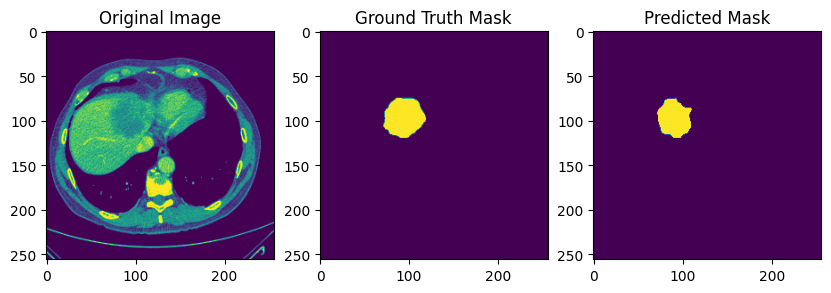

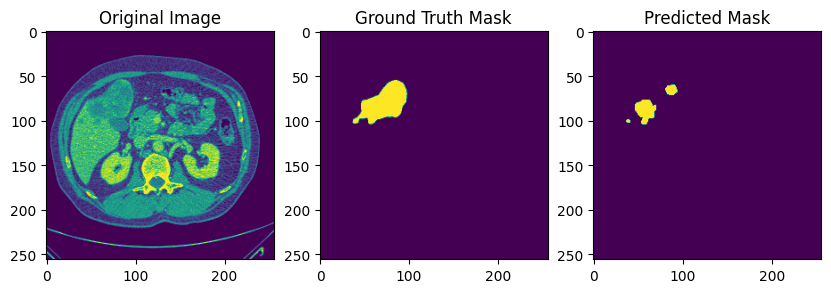

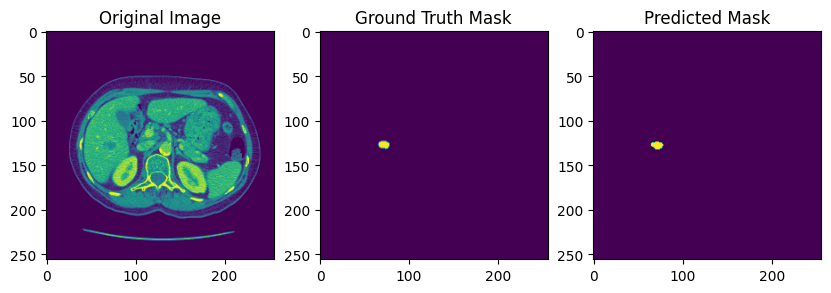

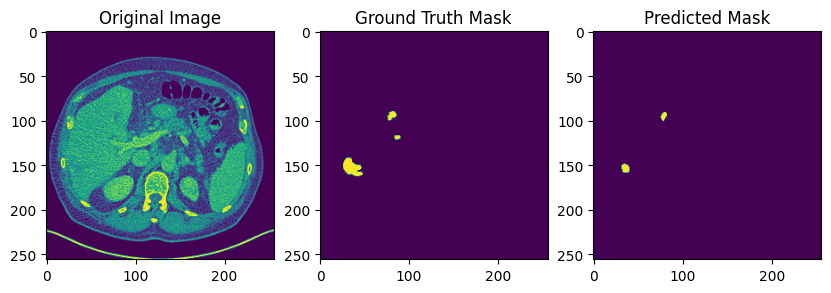

In [21]:
##This section chooses 100 random images from X_test and Y_test and shows the model output on them, along with input and ground truth
import random
# Select 100 random images from Xm_test and Ym_test
random_indices = random.sample(range(len(Xm_test)), 100)
selected_X_test = [Xm_test[i] for i in random_indices]
selected_Y_test = [Ym_test[i] for i in random_indices]
print(selected_X_test)
g = lambda x:load_and_preprocess(x)
imgs = [g(x) for x in selected_X_test]
# Evaluate the model on the selected images
y_pred = model.predict(np.array(imgs))

# Compare the model output and Y
for i in range(100):
  plt.figure(figsize=(10, 5))

  # Original image
  plt.subplot(1, 3, 1)
  plt.imshow(g(selected_X_test[i]))
  plt.title('Original Image')

  # Ground truth mask
  plt.subplot(1, 3, 2)
  plt.imshow(g(selected_Y_test[i]))
  plt.title('Ground Truth Mask')

  # Predicted mask
  plt.subplot(1, 3, 3)
  plt.imshow(y_pred[i])
  plt.title('Predicted Mask')

  plt.show()
